In [11]:
from PseudoSeg_utils import *
from original_utils import PreProcessing
from sklearn.model_selection import train_test_split
import satlaspretrain_models
import json

## PREPARE NEW DATA
we use an additional dataset here so some exploration and preparation is needed 

In [2]:
# Load the CSV data containing image labels
csv_path = '/Users/bragehs/Documents/train_v2.csv'
labels_df = pd.read_csv(csv_path)

# Display the first few rows of the dataframe to understand its structure
labels_df.head()

# Display the summary of the dataframe to understand its structure and data types
labels_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40479 entries, 0 to 40478
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_name  40479 non-null  object
 1   tags        40479 non-null  object
dtypes: object(2)
memory usage: 632.6+ KB


Filtering, relabeling and balancing dataset...
Original dataset size: 40479
After filtering for clear images: 28431
After removing images with only background label: 10656
Found 9810 background,plantation images, limiting to 1000
Final dataset size after balancing: 1846

Label distribution after relabeling and balancing:
background: 1846 images (100.00%)
plantation: 1272 images (68.91%)
mining: 373 images (20.21%)
logging: 308 images (16.68%)
grassland_shrubland: 173 images (9.37%)

Combined label distribution:
background,plantation: 1000 images (54.17%)
background,mining: 309 images (16.74%)
background,logging: 236 images (12.78%)
background,grassland_shrubland,plantation: 148 images (8.02%)
background,logging,plantation: 64 images (3.47%)
background,mining,plantation: 58 images (3.14%)
background,grassland_shrubland: 23 images (1.25%)
background,logging,mining: 5 images (0.27%)
background,grassland_shrubland,logging: 1 images (0.05%)
background,grassland_shrubland,logging,plantation:

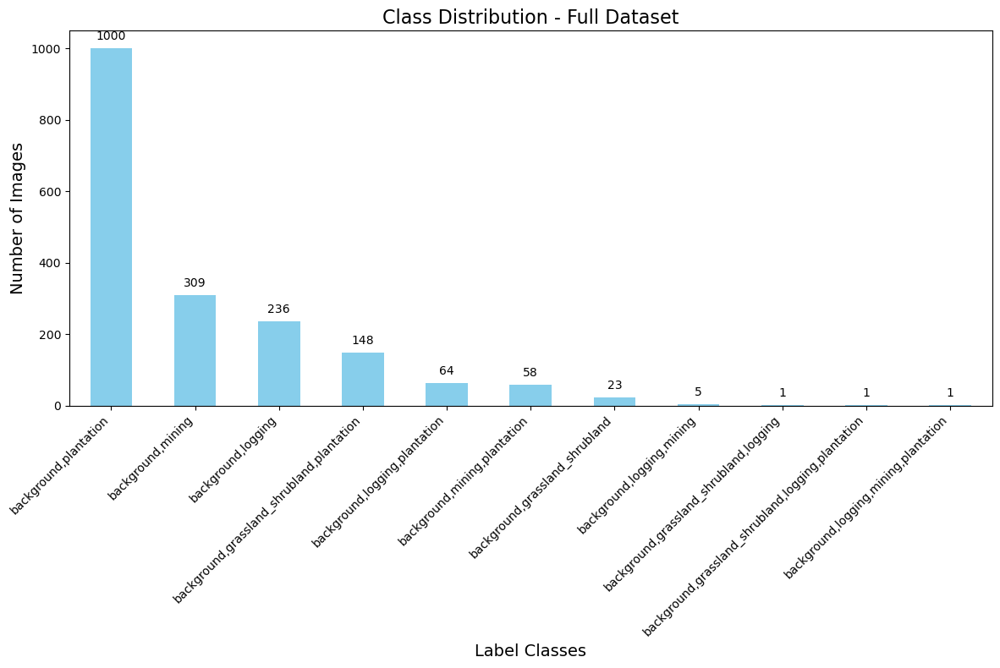


Displaying examples for category: mining


/opt/anaconda3/envs/satlaspretrain/lib/python3.9/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


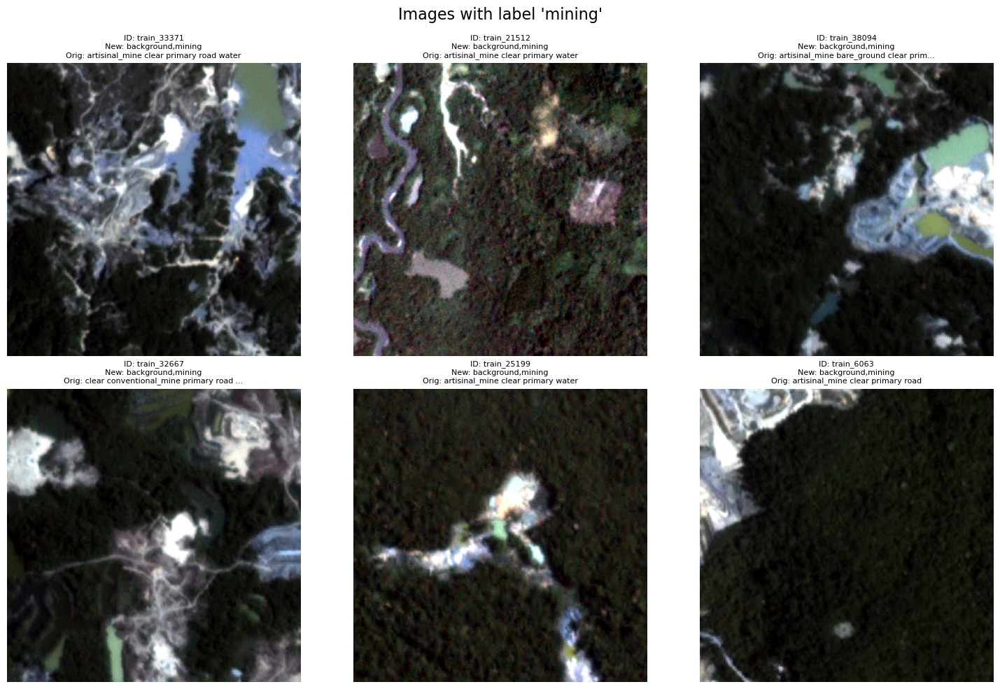


Displaying examples for category: plantation


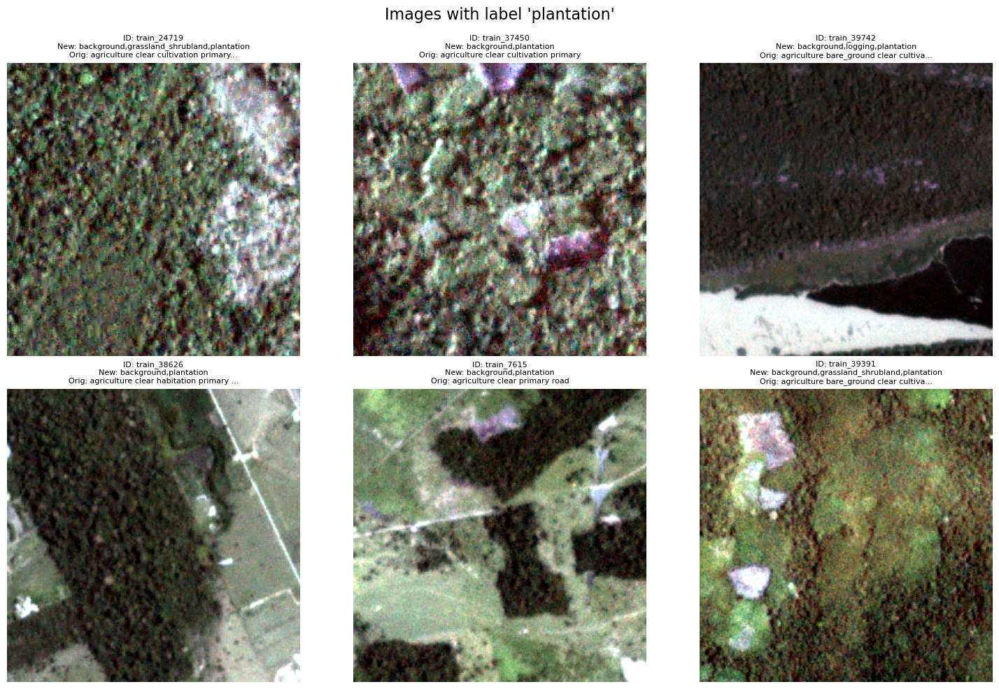


Displaying examples for category: logging


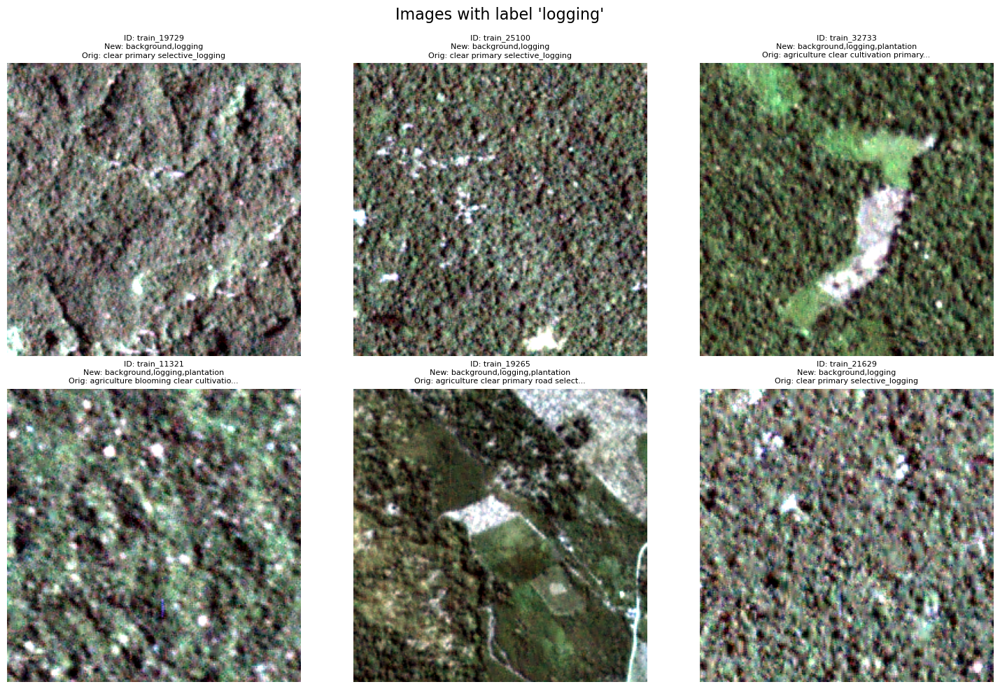


Displaying examples for category: grassland_shrubland


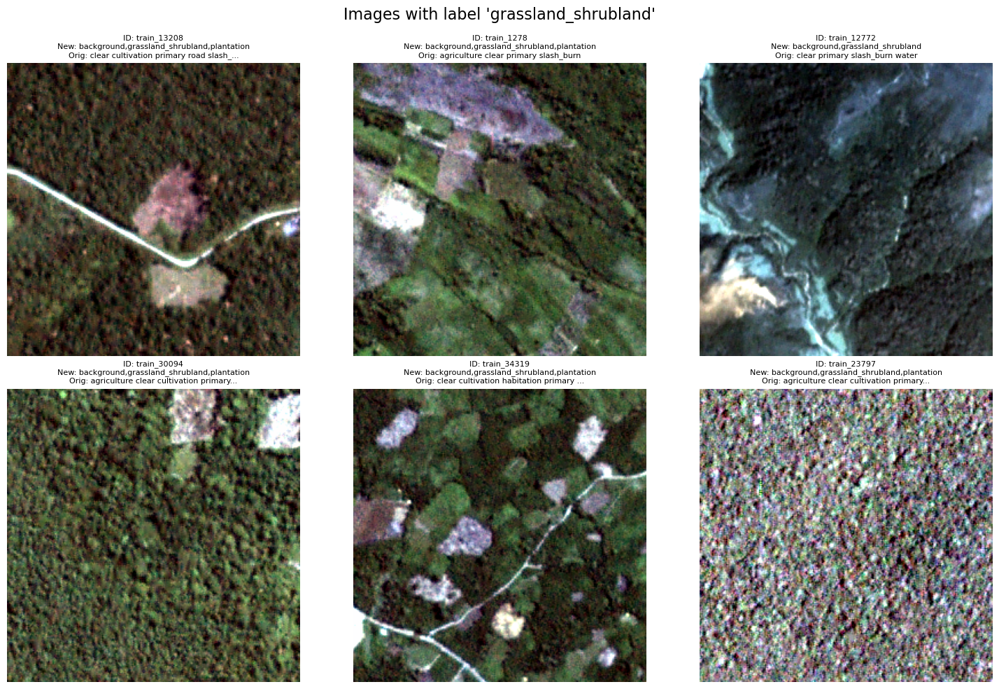

In [3]:
label_column = 'tags'  # Update this to match your actual column name

print("Filtering, relabeling and balancing dataset...")
filtered_df = filter_relabel_and_balance_dataset(
    labels_df, 
    label_column=label_column, 
    max_background_plantation=1000
)

# Save the processed datasets to CSV files
filtered_df.to_csv('filtered_balanced_dataset.csv', index=False)

print("\nDatasets saved to CSV files:")
print("- 'filtered_balanced_dataset.csv' (full dataset)")


# Visualize class distributions
plot_class_distribution(filtered_df, "Class Distribution - Full Dataset")

# Display examples of each category
for category in ['mining', 'plantation', 'logging', 'grassland_shrubland']:
    print(f"\nDisplaying examples for category: {category}")
    display_images_with_new_labels(filtered_df, category, num_images=6)

In [6]:
img_label_data = PreProcessing(train_set=False, satlas=False, img_labels=True)
img_label_data.preprocess()

#This needs to be run only once to save the preprocessed data
#img_label_data.save_preprocessed(filename='/image_label_data.npy', labels = False)

Loaded 1846 images
Processing train_1.tif
Processing train_8.tif
Processing train_10.tif
Processing train_36.tif
Processing train_57.tif
Processing train_58.tif
Processing train_82.tif
Processing train_94.tif
Processing train_122.tif
Processing train_129.tif
Processing train_146.tif
Processing train_151.tif
Processing train_159.tif
Processing train_166.tif
Processing train_185.tif
Processing train_187.tif
Processing train_199.tif
Processing train_213.tif
Processing train_237.tif
Processing train_247.tif
Processing train_274.tif
Processing train_281.tif
Processing train_286.tif
Processing train_309.tif
Processing train_324.tif
Processing train_358.tif
Processing train_379.tif
Processing train_381.tif
Processing train_391.tif
Processing train_421.tif
Processing train_448.tif
Processing train_456.tif
Processing train_464.tif
Processing train_465.tif
Processing train_477.tif
Processing train_521.tif
Processing train_544.tif
Processing train_552.tif
Processing train_590.tif
Processing train

/opt/anaconda3/envs/satlaspretrain/lib/python3.9/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Processing train_728.tif
Processing train_746.tif
Processing train_750.tif
Processing train_871.tif
Processing train_997.tif
Processing train_1066.tif
Processing train_1087.tif
Processing train_1089.tif
Processing train_1093.tif
Processing train_1115.tif
Processing train_1134.tif
Processing train_1143.tif
Processing train_1151.tif
Processing train_1163.tif
Processing train_1181.tif
Processing train_1188.tif
Processing train_1238.tif
Processing train_1262.tif
Processing train_1278.tif
Processing train_1309.tif
Processing train_1319.tif
Processing train_1337.tif
Processing train_1340.tif
Processing train_1341.tif
Processing train_1352.tif
Processing train_1359.tif
Processing train_1364.tif
Processing train_1373.tif
Processing train_1386.tif
Processing train_1418.tif
Processing train_1430.tif
Processing train_1434.tif
Processing train_1436.tif
Processing train_1465.tif
Processing train_1501.tif
Processing train_1502.tif
Processing train_1527.tif
Processing train_1533.tif
Processing train_

In [7]:
current_dir = os.getcwd()
print(f"Current working directory: {current_dir}")

Current working directory: /Users/bragehs/Documents/INF367A-DeforestationDrivers


In [ ]:
X_train = np.load(current_dir + "/data/prepared_data.npy")
y_train = np.load(current_dir + "/data/labels.npy")
image_level_images = np.load(current_dir + "/data/image_label_data.npy")

In [ ]:
image_level_images = image_level_images[:, :3, :, :]
X_train = reshape_bands_bgr_to_rgb(X_train[:, 1:4, :, :])

In [ ]:
df = pd.read_csv(current_dir + "/data/filtered_balanced_dataset.csv")
df = df.sort_values(by=["image_name"], key=lambda col: col.apply(sort_by_image_number))
df = df.reset_index(drop=True)

In [ ]:
image_labels = np.zeros((len(df), 4), dtype=int)

for i, row in df.iterrows():
    labels = row['new_label'].split(',')
    for label in labels:
        if label == 'plantation':
            image_labels[i, 0] = 1
        elif label == 'grassland_shrubland':
            image_labels[i, 1] = 1
        elif label == 'mining':
            image_labels[i, 2] = 1
        elif label == 'logging':
            image_labels[i, 3] = 1

In [ ]:
plot_histograms(image_level_images, 'Unsupervised (image_level_images)')

# Visualize histograms for supervised dataset (X_train)
plot_histograms(X_train, 'Supervised (X_train)')

In [ ]:
bright_reference = create_bright_reference()

# Plot histogram of reference distribution
plot_histograms(bright_reference, 'Bright Reference')

# Match both datasets to this reference
X_train = histogram_match_images(X_train, bright_reference)
image_level_images = histogram_match_images(image_level_images, bright_reference)

# Visualize results

plot_histograms(X_train, 'Brightened Supervised')
plot_histograms(image_level_images, 'Brightened Unsupervised')

In [ ]:
# Visualize 10 images from image_level_images
visualize_images(X_train, num_images=10)
visualize_images(image_level_images, num_images=10)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=99)

In [ ]:
weights_manager = satlaspretrain_models.Weights()
satlas_model = weights_manager.get_pretrained_model('Sentinel2_SwinB_SI_RGB',
                                                    num_categories = 5,fpn=True)

In [ ]:
satlas_model.head = PseudoSegHead(
    backbone_channels=satlas_model.backbone.out_channels,
    fpn_channels=satlas_model.fpn.out_channels,
    num_categories=5,
    only_decoder=False
)

In [ ]:
dummy_input = torch.randn(1, 3, 256, 256)
backbone_output = satlas_model.backbone(dummy_input) # Get backbone output

# Access raw_features (FPN output) from satlas_model
fpn_features = satlas_model.fpn(backbone_output)  # If you're using FPN
raw_features = satlas_model.upsample(fpn_features)

# Pass the combined list to SimpleHead
dummy_output = satlas_model.head(backbone_output, raw_features)[0]
print(dummy_output[0].shape) # Print the raw_outputs from SimpleHead
print(dummy_output[1].shape) # Print the cls_logits from SimpleHead (if not inference mode)
print(dummy_output[2].shape) # print self_att_gradcam_1 from SimpleHead
print(dummy_output[3].shape) # print self_att_gradcam_2 from SimpleHead

In [ ]:
def tune_hyperparameters(
    model,
    train_images,
    train_labels,
    val_images,
    val_labels,
    image_level_images,
    image_labels,
    n_trials=10,
    patch_size=256,
    patch_stride=128,
    batch_size=4,
    num_epochs=10,
    device='cuda',
    save_dir="/content/drive/MyDrive/my_models/",
    random_seed=123,
):
    """
    Tune hyperparameters using random search.

    Args:
        model: The model to tune
        train_images: List of training images
        train_labels: List of training labels
        val_images: List of validation images
        val_labels: List of validation labels
        image_level_images: List of image-level training images
        n_trials: Number of hyperparameter combinations to try
        patch_size: Size of patches to extract from images
        patch_stride: Stride between patches
        batch_size: Batch size for training
        num_epochs: Number of epochs for each trial
        device: Device to run on ('cuda' or 'cpu')
        save_dir: Directory to save models and results
        class_weights: Class weights for loss calculation
        random_seed: Random seed for reproducibility

    Returns:
        best_params: Dictionary of best hyperparameters
        best_model_path: Path to the best model
        results_df: DataFrame containing all trial results
    """
    import random
    import copy
    import gc

    # Set random seeds for reproducibility
    random.seed(random_seed)

    # Create directory for hyperparameter tuning results
    tuning_dir = os.path.join(save_dir, "hyperparameter_tuning")
    os.makedirs(tuning_dir, exist_ok=True)

    # Use only 20% of training data for faster tuning
    subset_size_train = int(len(train_images) * 0.2)
    subset_size_image_level = int(len(image_level_images) * 0.2)

    # Create random indices for subset selection
    train_indices = random.sample(range(len(train_images)), subset_size_train)
    image_level_indices = random.sample(range(len(image_level_images)), subset_size_image_level)

    # Select the subset of data
    subset_train_images = np.array(train_images)[train_indices]
    subset_train_labels = np.array(train_labels)[train_indices]
    subset_image_level_images = np.array(image_level_images)[image_level_indices]


    print(f"Using {len(subset_train_images)} images for training (20% of original)")
    print(f"Using {len(subset_image_level_images)} images for image-level training (20% of original)")

    # Define hyperparameter search spaces
    param_space = {
          'learning_rate': [1e-4],
          'weight_decay': [0.01, 0.05, 0.1, 0.5],
          'T': [0.5, 0.7, 1.0],
          'gamma': [0.25, 0.5, 0.75]
    }
    # Initialize tracking variables
    best_f1 = 0
    best_params = None

    # Run random search
    for trial in range(n_trials):
        # Sample random hyperparameters
        current_params = {
            'learning_rate': random.choice(param_space['learning_rate']),
            'weight_decay': random.choice(param_space['weight_decay']),
            'T': random.choice(param_space['T']),
            'gamma': random.choice(param_space['gamma'])
        }


        print(f"\n\n===== TRIAL {trial+1}/{n_trials} =====")
        print(f"Hyperparameters: {current_params}")

        # Create a trial-specific save directory
        trial_dir = os.path.join(tuning_dir, f"trial_{trial+1}")
        os.makedirs(trial_dir, exist_ok=True)

        # Make a deep copy of the model to ensure independence between trials
        #trial_model = type(model)(*model.__init__args__, **model.__init__kwargs__)
        trial_model = copy.deepcopy(model)
        trial_model.load_state_dict(model.state_dict())
        trial_model = trial_model.to(device)

        # Train model with current hyperparameters
        _, val_f1 = train_model(
            model=trial_model,
            train_images=subset_train_images,
            train_labels=subset_train_labels,
            val_images=val_images,
            val_labels=val_labels,
            image_level_images=subset_image_level_images,
            image_labels=image_labels,
            num_epochs=num_epochs,
            batch_size=batch_size,
            patch_size=patch_size,
            patch_stride=patch_stride,
            learning_rate=current_params['learning_rate'],
            weight_decay=current_params['weight_decay'],
            T=current_params['T'],
            gamma=current_params['gamma'],
            device=device,
            save_dir=trial_dir,
            visualize_freq=999,  # Limit visualizations during tuning
        )
        # Update best model if needed
        if val_f1 > best_f1:
            best_f1 = val_f1
            best_params = current_params.copy()

        #trying to clear memory
        trial_model = trial_model.cpu()
        del trial_model
        torch.cuda.empty_cache()
        gc.collect()


        print(f"\nCurrent trial F1: {val_f1:.4f}")
        print(f"Best F1 so far: {best_f1:.4f}")
        print(f"Best parameters so far: {best_params}")

    # Print final results
    print("\n===== HYPERPARAMETER TUNING COMPLETE =====")
    print(f"Best validation F1: {best_f1:.4f}")
    print(f"Best hyperparameters: {best_params}")

    return best_params

In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
best_params = tune_hyperparameters(
    model=satlas_model,
    train_images = X_train,
    train_labels = y_train,
    val_images = X_val,
    val_labels = y_val,
    image_level_images = image_level_images,
    image_labels = image_labels,
    patch_size = 256,
    patch_stride = 256,
    batch_size = 8,
    n_trials = 7,
    num_epochs = 10,
)

In [ ]:
with open(current_dir + "/best_params.json", "w") as f:
       json.dump(best_params, f)
       f.flush()  # Flush the data to the file
       os.fsync(f.fileno())  # Ensure data is written to disk

In [ ]:
with open(current_dir + "/best_params.json", "r") as f:
    loaded_params = json.load(f)
loaded_params

In [ ]:
satlas_model = satlas_model.to(device)

In [ ]:
final_model, final_f1 = train_model(
    model=satlas_model,
    train_images=X_train,
    train_labels=y_train,
    val_images=X_val,
    val_labels=y_val,
    image_level_images=image_level_images,
    image_labels=image_labels,
    num_epochs=40,
    batch_size = 8,
    learning_rate=1e-4,
    weight_decay=0.1,
    T=loaded_params['T'],
    gamma=loaded_params['gamma'],
    save = True,
    use_scheduler=True,
    visualize_freq=500,
    device=device,
    )